## Machine Learning & AI

![Colegio Bourbaki](./Images/Bourbaki.png)

### Modelos Multimodales de Texto e Imágenes

### Contexto

Fue en enero de 2021 cuando **OpenAI** anunció dos nuevos modelos: **DALL-E** y **CLIP**, ambos modelos **multimodales** que conectan **textos e imágenes** de alguna manera. 

Veremos como hacer inferencia en CLIP. 


### CLIP: Entrenamiento Texto-Imagen

En [Learning Transferable Visual Models From Natural Language Supervision paper](https://arxiv.org/abs/2103.00020), OpenAI presenta su nuevo modelo denominado **CLIP**, por **Contrastive Language-Image Pre-training**. En pocas palabras, este modelo aprende la relación entre una frase completa y la imagen que describe; en el sentido de que cuando el modelo está entrenado, dada una frase de entrada será capaz de recuperar las imágenes más relacionadas correspondientes a esa frase. Lo importante aquí es que se entrena con frases completas en lugar de con clases individuales como coche, perro, etc. La intuición es que cuando se entrena con frases completas, el modelo puede aprender muchas más cosas y encuentra algún patrón entre imágenes y textos.

También demuestran que cuando este modelo se entrena con un enorme conjunto de datos de imágenes y sus correspondientes textos, también puede actuar como clasificador. Le animo a estudiar el artículo para saber más sobre este interesante modelo y sus sorprendentes resultados en conjuntos de datos de referencia. Por mencionar sólo uno, ¡el modelo CLIP entrenado con esta estrategia clasifica ImageNet mejor que los modelos SOTA entrenados en la propia ImageNet optimizada para la única tarea de clasificación!

![clip](./Images/clip.png)

A modo de preparacion, veamos de qué es capaz el modelo. Dada una consulta (texto en bruto) como "un chico saltando con monopatín" o "una chica saltando desde un columpio", el modelo recuperará las imágenes más relevantes:

![teaser1](./Images/teaser.png)

Veamos otra salida:

![teaser2](./Images/dogs.png)

En esta notebook veremos cómo utilizar un modelo CLIP preentrenado para:

1. Clasificación Zero-Shot
2. Recuperación texto → imagen
3. Recuperación imagen → texto

Dataset: https://www.kaggle.com/datasets/adityajn105/flickr8k

---

### Librerías

In [1]:
!python pip install open-clip tqdm

/bin/bash: line 1: python: command not found


In [2]:
import math
import numpy as np
import os
import pandas as pd
import sys
from dataclasses import dataclass

import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import open_clip
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm

### Configuraciones

In [3]:
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:32"
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True
torch.cuda.empty_cache()
torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark = False

In [4]:
print("__Python VERSION:", sys.version)
print("__pyTorch VERSION:", torch.__version__)
print("__CUDNN VERSION:", torch.backends.cudnn.version())
print("__Number CUDA Devices:", torch.cuda.device_count())
print("__Devices")
print("Active CUDA Device: GPU", torch.cuda.current_device())
print("Available devices ", torch.cuda.device_count())
print("Current cuda device ", torch.cuda.current_device())


__Python VERSION: 3.12.11 (main, Sep  5 2025, 19:35:43) [GCC 13.3.0]
__pyTorch VERSION: 2.13.0+cu130
__CUDNN VERSION: 92000
__Number CUDA Devices: 1
__Devices
Active CUDA Device: GPU 0
Available devices  1
Current cuda device  0


In [5]:
! nvidia-smi

Sun Jul 26 17:04:29 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 595.84                 Driver Version: 595.84         CUDA Version: 13.2     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1650 Ti     Off |   00000000:01:00.0  On |                  N/A |
| N/A   45C    P8              4W /   50W |     150MiB /   4096MiB |     33%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [6]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [7]:
device

'cuda'

### Configuraciones del Modelo (setup)

El uso de modelos preentrenados (resnet50 para imágenes y distilbert-base-uncased para texto) aprovecha el enfoque que aprovecha el aprendizaje por transferencia (Transfer Learning), ajustando modelos que han sido preentrenados en grandes conjuntos de datos para beneficiarse de representaciones aprendidas previamente.

Primero, vamos a obtener los archivos de imagen y extraer sus tamaños.

In [8]:
@dataclass
class CFG:
    # === RUTAS ===
    image_path: str = (
        "/mnt/lg_externo/Pablo/Personal/Colegio_Bourbaki/ML_AI/Semana1/Data/Images"  # carpeta Flickr8k_Dataset
    )
    captions_csv: str = (
        "/mnt/lg_externo/Pablo/Personal/Colegio_Bourbaki/ML_AI/Semana1/Data/captions.csv"  # CSV con columnas: image, caption
    )

    # === DATALOADER ===
    batch_size: int = 128 
    num_workers: int = 4
    seed: int = 42
    debug: bool = False
    debug_n_images: int = 500

    # === CACHE ===
    cache_dir: str = "./cache_clip_flickr8k"


CFG = CFG()
os.makedirs(CFG.cache_dir, exist_ok=True)

np.random.seed(CFG.seed)
torch.manual_seed(CFG.seed)
if device == "cuda":
    torch.cuda.manual_seed_all(CFG.seed)

print("Cache dir:", CFG.cache_dir)
print("image_path:", CFG.image_path)
print("captions_csv:", CFG.captions_csv)

Cache dir: ./cache_clip_flickr8k
image_path: /mnt/lg_externo/Pablo/Personal/Colegio_Bourbaki/ML_AI/Semana1/Data/Images
captions_csv: /mnt/lg_externo/Pablo/Personal/Colegio_Bourbaki/ML_AI/Semana1/Data/captions.csv


In [9]:
def get_image_files(directory, extensions={".jpg", ".jpeg", ".png", ".bmp", ".tiff"}):
    """
    Recursively retrieves all image file paths with the specified extensions from the given directory.
    """
    image_files = []
    for root, _, files in os.walk(directory):
        for file in files:
            if any(file.lower().endswith(ext) for ext in extensions):
                image_files.append(os.path.join(root, file))
    return image_files

In [10]:
def extract_image_sizes(image_files):
    """
    Extracts the width and height of each image in the provided list.
    """
    image_data = []
    for img_path in tqdm(image_files, desc="Processing Images"):
        with Image.open(img_path) as img:
            width, height = img.size
            image_data.append(
                {"Image_Path": img_path, "Width": width, "Height": height}
            )
    return image_data

In [11]:
image_files = get_image_files("./Data/Images")
image_data = extract_image_sizes(image_files)

Processing Images: 100%|██████████| 8091/8091 [00:01<00:00, 6933.40it/s]


In [12]:
df = pd.DataFrame(image_data)
df

,Image_Path,Width,Height
0,./Data/Images/972381743_5677b420ab.jpg,353,500
1,./Data/Images/973827791_467d83986e.jpg,333,500
2,./Data/Images/97406261_5eea044056.jpg,500,375
3,./Data/Images/974924582_10bed89b8d.jpg,333,500
4,./Data/Images/975131015_9acd25db9c.jpg,500,333
...,...,...,...
8086,./Data/Images/3405942945_f4af2934a6.jpg,500,333
8087,./Data/Images/3406116788_c8f62e32d1.jpg,375,500
8088,./Data/Images/3406409018_03de95181e.jpg,500,352
8089,./Data/Images/340667199_ecae5f6029.jpg,492,500


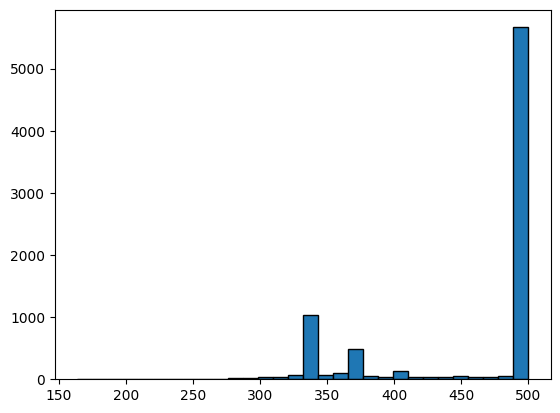

In [13]:
plt.hist(df["Width"], bins=30, edgecolor="black")
plt.show()

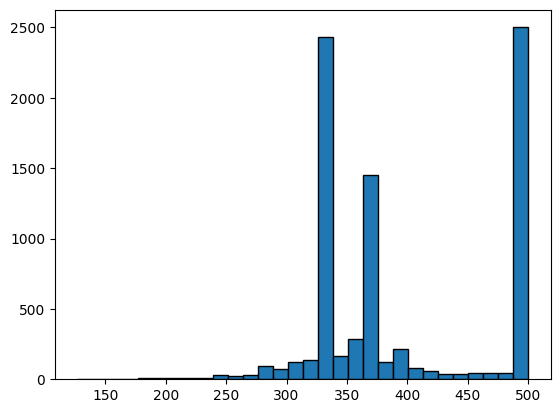

In [14]:
plt.hist(df["Height"], bins=30, edgecolor="black")
plt.show()

In [15]:
df.describe()

,Width,Height
count,8091.000000,8091.000000
mean,457.872204,397.251885
std,68.659411,75.670168
min,164.000000,127.000000
25%,400.000000,333.000000
50%,500.000000,375.000000
75%,500.000000,500.000000
max,500.000000,500.000000


Veamos el tamaño de los textos

In [16]:
# importar el archivo captions.txt
df_captions = pd.read_csv("./Data/captions.txt", sep=",")

In [17]:
df_captions.head()

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


In [18]:
# get the length of the captions in every record
df_captions["length_captions"] = df_captions["caption"].apply(len)

In [19]:
df_captions.head()

,image,caption,length_captions
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...,72
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .,37
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .,48
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...,52
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...,57


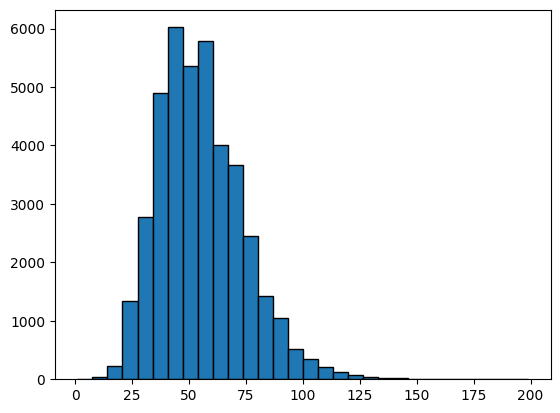

In [20]:
plt.hist(df_captions["length_captions"], bins=30, edgecolor="black")
plt.show()

In [21]:
df_captions["length_captions"].describe()

count    40455.000000
mean        55.134297
std         18.839396
min          1.000000
25%         41.000000
50%         53.000000
75%         66.000000
max        199.000000
Name: length_captions, dtype: float64

Seteamos dataframes validos:

In [22]:
def make_train_valid_dfs(
    dataframe: pd.DataFrame, seed: int = 42, valid_frac: float = 0.2
):
    unique_images = dataframe["image"].unique()
    rng = np.random.default_rng(seed)
    valid_images = rng.choice(
        unique_images, size=int(valid_frac * len(unique_images)), replace=False
    )

    train_df = dataframe[~dataframe["image"].isin(valid_images)].reset_index(
        drop=True
    )
    valid_df = dataframe[dataframe["image"].isin(valid_images)].reset_index(
        drop=True
    )
    return train_df, valid_df

In [23]:
train_df, valid_df = make_train_valid_dfs(df_captions, seed=CFG.seed)
print(
    "train rows:", len(train_df), "| train unique images:", train_df["image"].nunique()
)
print(
    "valid rows:", len(valid_df), "| valid unique images:", valid_df["image"].nunique()
)

train rows: 32365 | train unique images: 6473
valid rows: 8090 | valid unique images: 1618


Vamos a cargar el modelo pre-entrenado. 
- Modelo recomendado para clase: `ViT-B-32` con pesos LAION.
- Es rápido y suficiente para demostrar retrieval.

In [24]:
clip_model_name = "ViT-B-32"
clip_pretrained = "laion2b_s34b_b79k"

clip_model, _, preprocess = open_clip.create_model_and_transforms(
    clip_model_name, pretrained=clip_pretrained
)
clip_model = clip_model.to(device).eval()
print("Loaded:", clip_model_name, "/", clip_pretrained)

Loaded: ViT-B-32 / laion2b_s34b_b79k


Veamos un resumen del modelo:

In [25]:
print("CLIP MODEL")

print(f"Architecture : {clip_model_name}")
print(f"Pretrained   : {clip_pretrained}")
print(f"Device       : {device}")

total_params = sum(p.numel() for p in clip_model.parameters())
trainable = sum(p.numel() for p in clip_model.parameters() if p.requires_grad)

print(f"Parameters   : {total_params:,}")
print(f"Trainable    : {trainable:,}")

CLIP MODEL
Architecture : ViT-B-32
Pretrained   : laion2b_s34b_b79k
Device       : cuda
Parameters   : 151,277,313
Trainable    : 151,277,313


Cargamos el tokenizador:

In [26]:
clip_tokenizer = open_clip.get_tokenizer(clip_model_name)

Para inferencia (sin entrenar) solo cargamos imágenes, aplicamos `preprocess`, y devolvemos tensor + filename.

In [27]:
class ImageOnlyDataset(Dataset):
    def __init__(self, image_filenames, image_root, preprocess):
        self.image_filenames = list(image_filenames)
        self.image_root = image_root
        self.preprocess = preprocess

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        fname = self.image_filenames[idx]
        path = os.path.join(self.image_root, fname)
        img = Image.open(path).convert("RGB")
        return {"image": self.preprocess(img), "image_filename": fname}


In [28]:
def build_image_loader_from_df(
    dataframe: pd.DataFrame, batch_size: int, num_workers: int
):
    uniq = dataframe["image"].drop_duplicates().tolist()  # 1 fila por imagen
    ds = ImageOnlyDataset(uniq, CFG.image_path, preprocess)
    dl = DataLoader(
        ds,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True,
    )
    return dl, uniq

In [29]:
valid_img_loader, valid_img_files = build_image_loader_from_df(
    valid_df, CFG.batch_size, CFG.num_workers
)
print("valid unique images:", len(valid_img_files))
batch = next(iter(valid_img_loader))
print(batch["image"].shape, batch["image_filename"][0])

valid unique images: 1618
torch.Size([128, 3, 224, 224]) 1015584366_dfcec3c85a.jpg


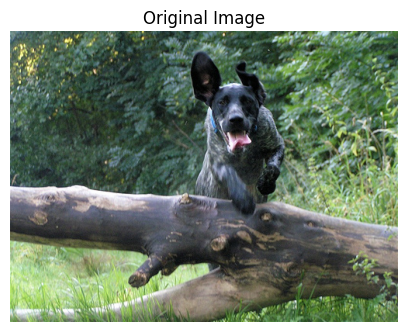

torch.Size([3, 224, 224])
tensor(-1.7923)
tensor(2.1459)


In [30]:
sample = Image.open(os.path.join(CFG.image_path, valid_img_files[0]))

plt.figure(figsize=(5, 5))
plt.imshow(sample)
plt.title("Original Image")
plt.axis("off")
plt.show()

processed = preprocess(sample)

print(processed.shape)
print(processed.min())
print(processed.max())

Precomputamos embeddings: Guardamos un '.pt' con embeddings y filenames para que sea instantáneo.

In [31]:
def encode_all_images(clip_model, dataloader, cache_path: str):
    if os.path.exists(cache_path):
        obj = torch.load(cache_path, map_location="cpu")
        return obj["embeddings"], obj["filenames"]

    all_embs, all_fnames = [], []
    with torch.inference_mode(): # faster and intended for inference
    # with torch.no_grad(): 
        for batch in tqdm(dataloader, desc="Encoding images"):
            imgs = batch["image"].to(device, non_blocking=True)
            feats = clip_model.encode_image(imgs)
            feats = F.normalize(feats, p=2, dim=-1)
            all_embs.append(feats.detach().cpu())
            all_fnames.extend(batch["image_filename"])

    emb = torch.cat(all_embs, dim=0)
    torch.save({"embeddings": emb, "filenames": all_fnames}, cache_path)
    return emb, all_fnames

**¿Por qué normalizamos los embeddings?**

Tanto las imágenes como los textos son representados por CLIP mediante **embeddings**, es decir, vectores de alta dimensión que capturan su significado semántico.

Sin embargo, dos embeddings pueden tener diferentes magnitudes (longitudes), por lo que compararlos directamente mediante un producto punto podría favorecer a aquellos vectores con mayor norma.

Para evitar este problema, normalizamos cada embedding para que tenga norma unitaria:

$\|\mathbf{x}\| = 1$

Después de la normalización, el producto punto entre dos embeddings es equivalente a la **similitud por coseno**:

$\mathbf{x}^\top\mathbf{y} = \cos(\theta)$

donde $\theta$ es el ángulo entre ambos vectores.

Esto significa que:

- Si dos embeddings representan conceptos similares, el ángulo entre ellos será pequeño y la similitud será cercana a **1**.
- Si representan conceptos diferentes, el ángulo será mayor y la similitud disminuirá hacia **0**.
- Si representan conceptos opuestos, la similitud será negativa.

Por esta razón, CLIP utiliza la similitud por coseno para comparar imágenes y textos, independientemente de la magnitud de sus embeddings.

In [32]:
img_cache = os.path.join(CFG.cache_dir, "valid_img_emb.pt")
valid_img_emb, valid_img_files_ordered = encode_all_images(
    clip_model, valid_img_loader, img_cache
)

In [33]:
print("Image embeddings:", valid_img_emb.shape)
print("Embedding dimension:", valid_img_emb.shape[1])
print("First filename:", valid_img_files_ordered[0])
print(valid_img_emb[0][:20])

Image embeddings: torch.Size([1618, 512])
Embedding dimension: 512
First filename: 1015584366_dfcec3c85a.jpg
tensor([-0.0443,  0.0457, -0.0367,  0.0487, -0.0382,  0.0132,  0.0340,  0.0161,
         0.0346,  0.0535,  0.0293, -0.0050, -0.0329, -0.0455,  0.0200,  0.0496,
        -0.0594, -0.0098, -0.0178, -0.0281])


Usamos 1 caption (la primera) por imagen para el plot.

In [34]:
def make_image_to_caption(dataframe: pd.DataFrame):
    d = dataframe.drop_duplicates("image", keep="first")
    return dict(zip(d["image"].tolist(), d["caption"].tolist()))

In [35]:
image_to_caption = make_image_to_caption(valid_df)
list(image_to_caption.items())[:3]

[('1015584366_dfcec3c85a.jpg', 'A black dog leaps over a log .'),
 ('1016887272_03199f49c4.jpg', 'A collage of one person climbing a cliff .'),
 ('1019077836_6fc9b15408.jpg',
  'A brown dog chases the water from a sprinkler on a lawn .')]

## Inferencia

Vamos hacer la inferencia, que en nuestro caso consistirá en dar al modelo un texto y pedirle que recupere las imágenes más relevantes.

En esta función, cargamos el modelo que hemos guardado tras el entrenamiento, lo alimentamos con imágenes del conjunto de validación y devolvemos image_embeddings con forma (valid_set_size, image_size) y el propio modelo.

In [36]:
def find_matches_openclip(
    clip_model,
    clip_tokenizer,
    image_embeddings_cpu: torch.Tensor,  # [N, D] en CPU
    image_filenames: list,
    image_to_caption: dict,
    query: str,
    n: int = 9,
):
    clip_model.eval()

    tok = clip_tokenizer([query]).to(device)
    with torch.inference_mode():
        text_emb = clip_model.encode_text(tok)
        text_emb = F.normalize(text_emb, p=2, dim=-1)
    
    img_emb = image_embeddings_cpu.to(device)
    sim = (text_emb @ img_emb.T).squeeze(0)
    values, indices = torch.topk(sim, k=n)

    cols = int(math.ceil(math.sqrt(n)))
    rows = int(math.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = np.array(axes).reshape(-1)

    for ax_i, ax in enumerate(axes):
        if ax_i >= n:
            ax.axis("off")
            continue

        idx = indices[ax_i].item()
        score = values[ax_i].item()
        fname = image_filenames[idx]
        cap = image_to_caption.get(fname, "(no caption)")

        img = Image.open(os.path.join(CFG.image_path, fname)).convert("RGB")
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(f"{cap}\nscore={score:.3f}", fontsize=9)

    plt.suptitle(f"Query: {query}", fontsize=14)
    plt.tight_layout()
    plt.show()

Primer query general:

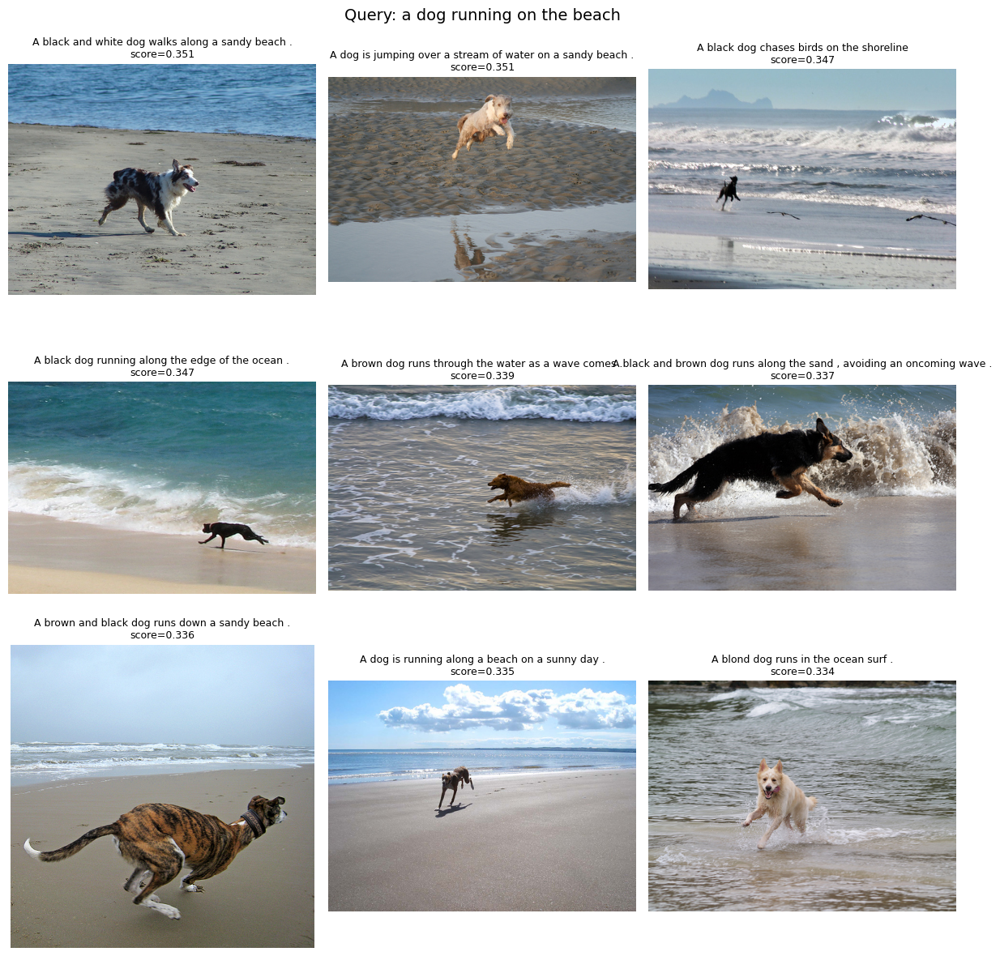

In [37]:
find_matches_openclip(
    clip_model,
    clip_tokenizer,
    valid_img_emb,
    valid_img_files_ordered,
    image_to_caption,
    query="a dog running on the beach",
    n=9,
)

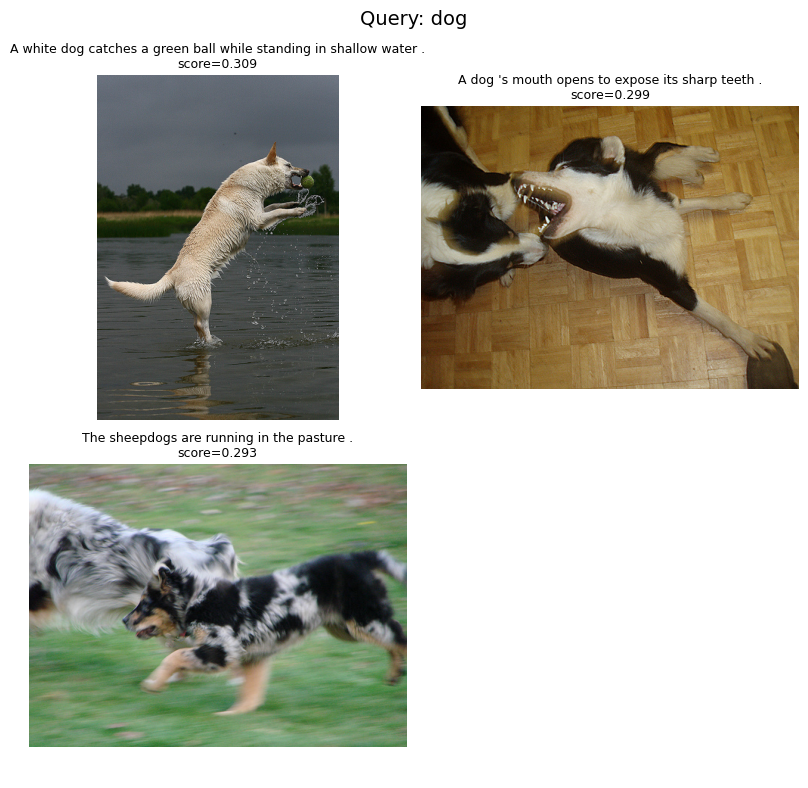

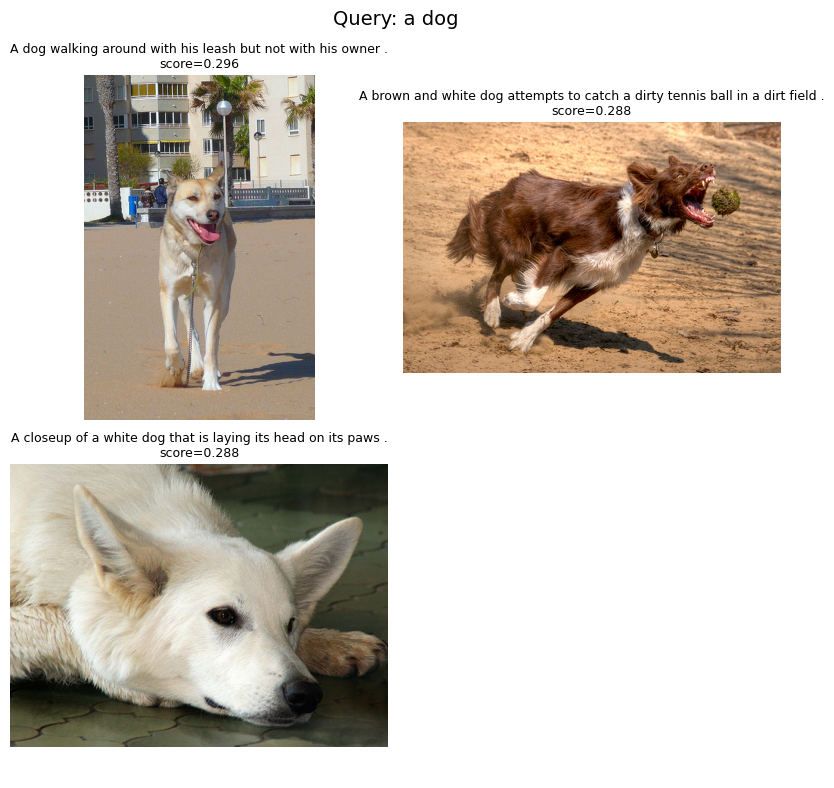

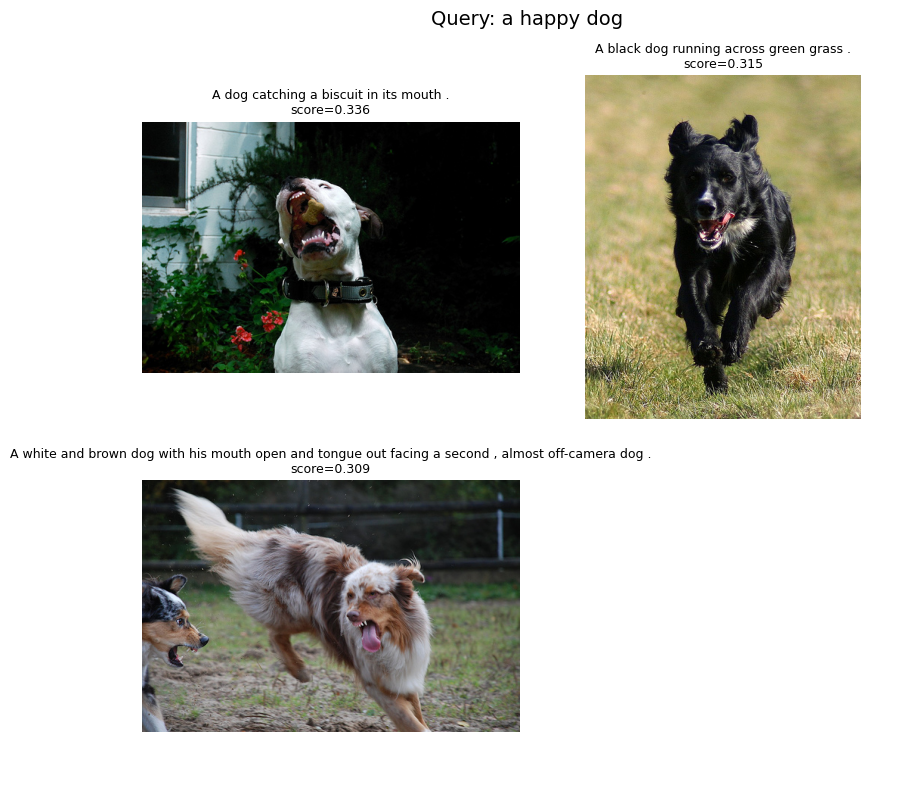

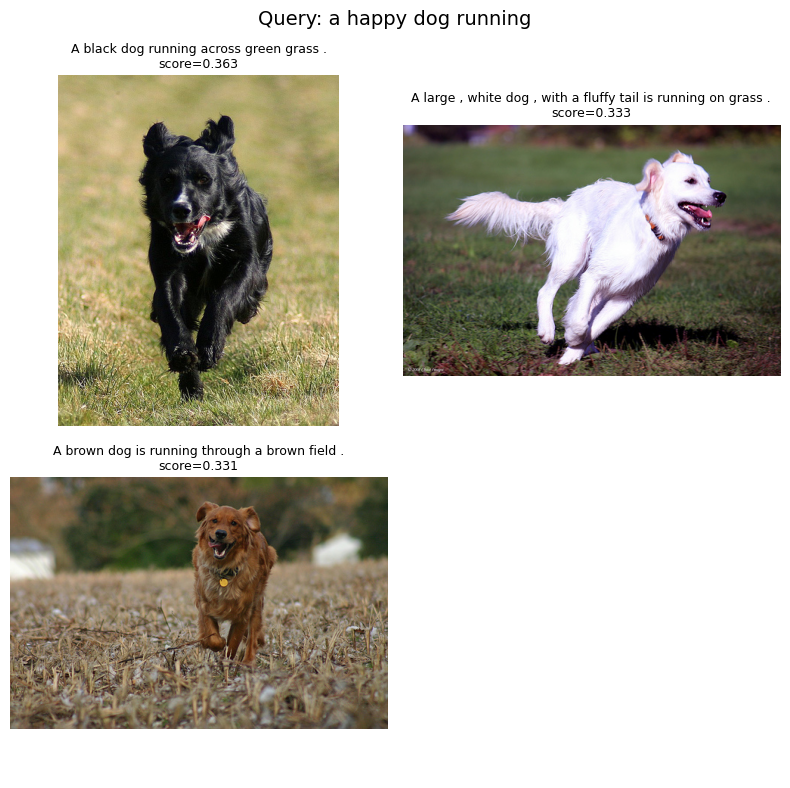

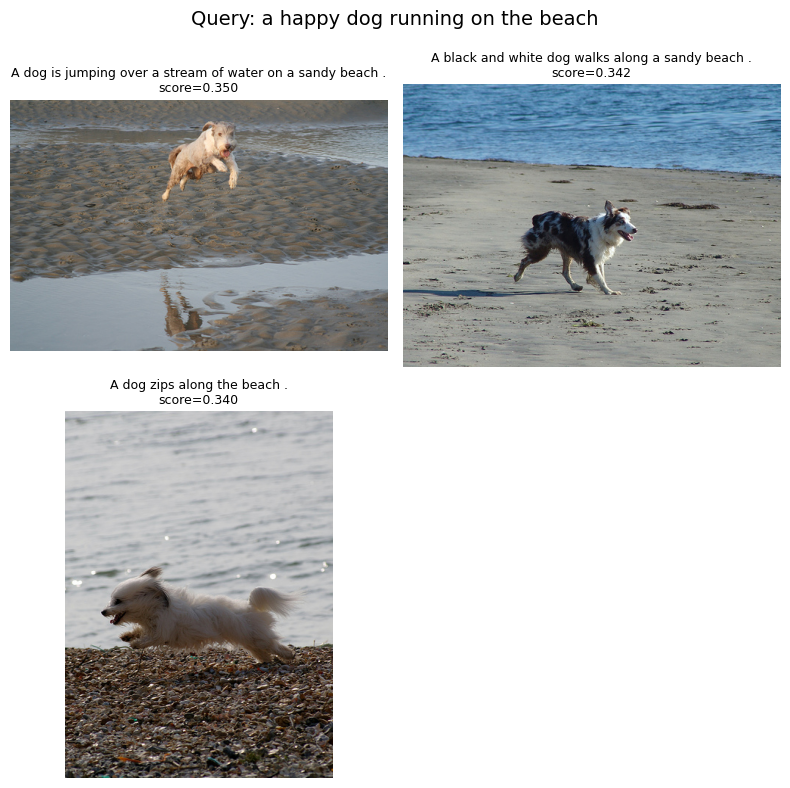

In [38]:
queries = [
    "dog",
    "a dog",
    "a happy dog",
    "a happy dog running",
    "a happy dog running on the beach",
]

for q in queries:
    print("=" * 60)
    find_matches_openclip(
        clip_model,
        clip_tokenizer,
        valid_img_emb,
        valid_img_files_ordered,
        image_to_caption,
        query=q,
        n=3,
    )

Segunda query general:

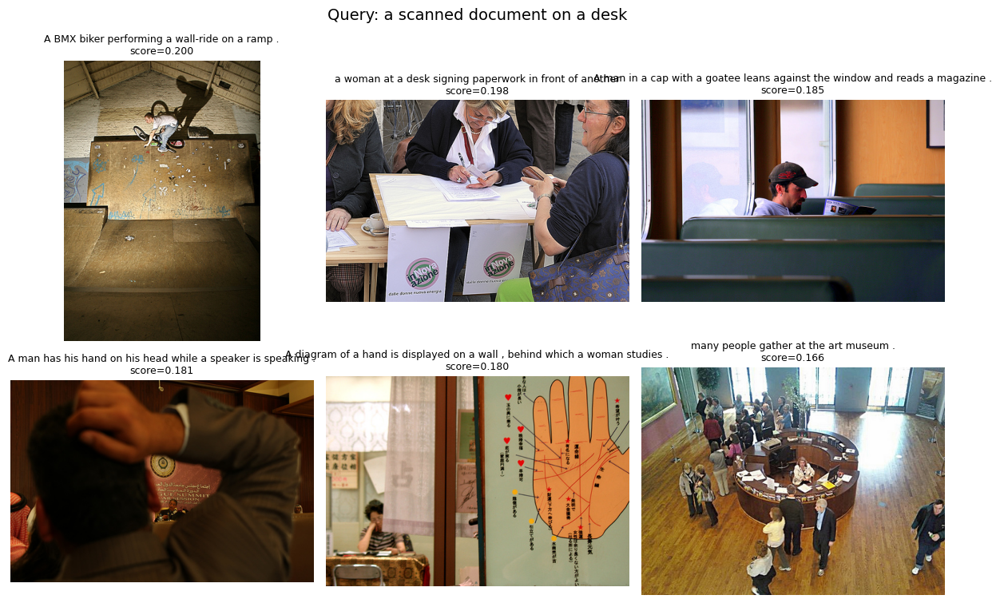

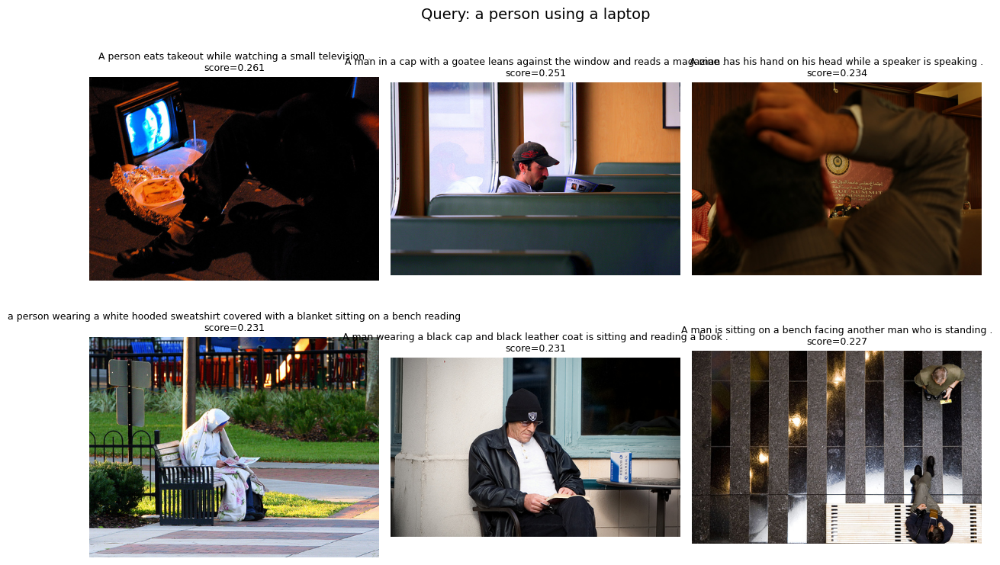

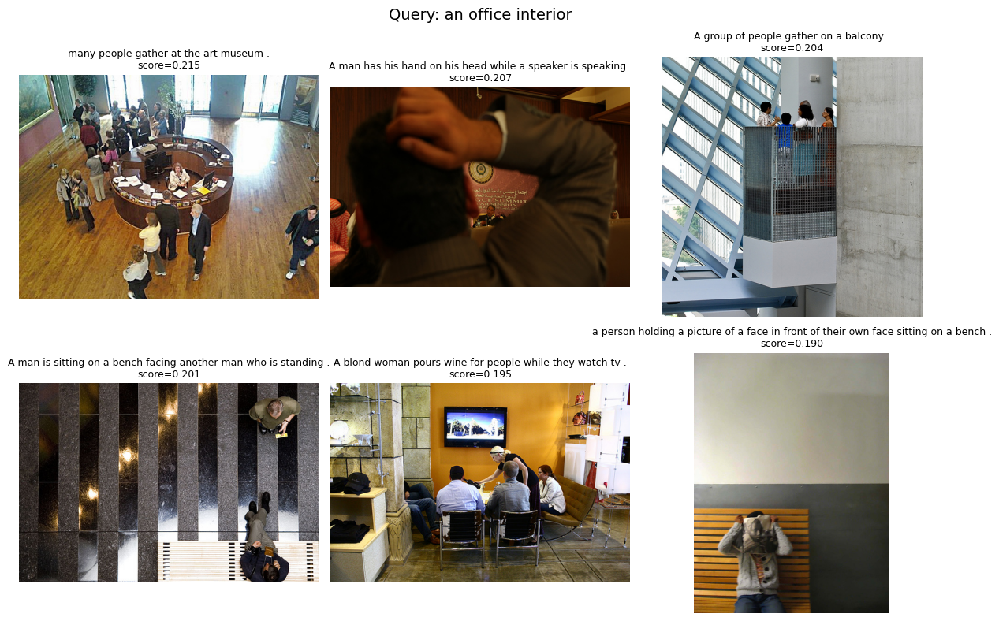

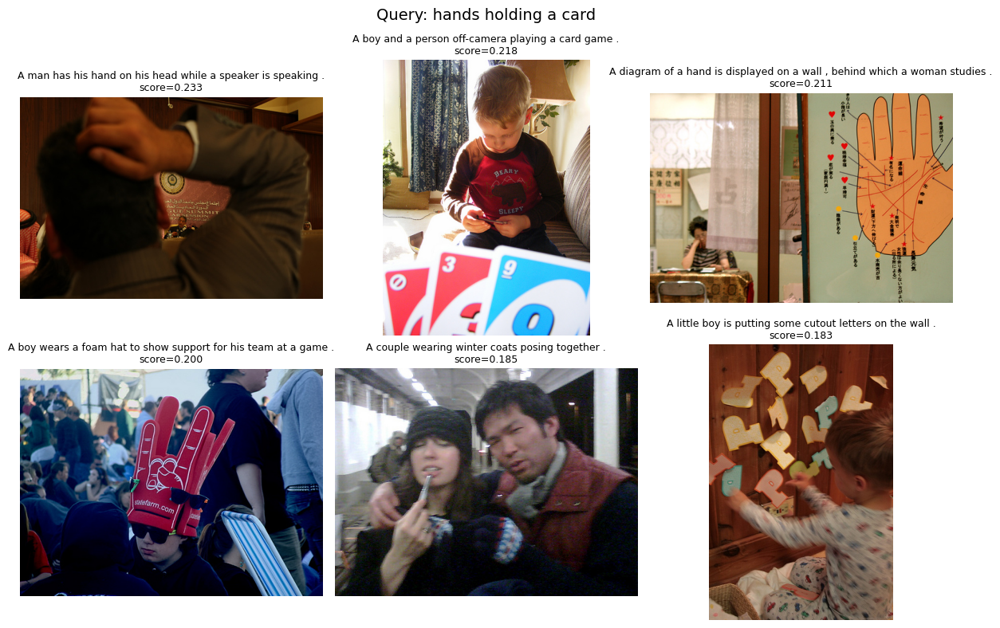

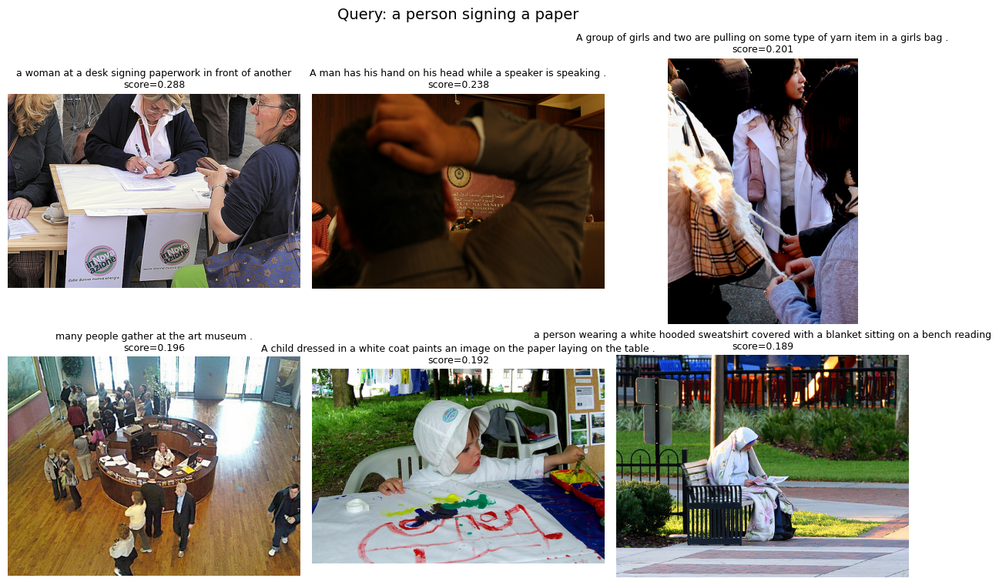

In [39]:
bankish_queries = [
    "a scanned document on a desk",
    "a person using a laptop",
    "an office interior",
    "hands holding a card",
    "a person signing a paper",
]

for q in bankish_queries:
    find_matches_openclip(
        clip_model,
        clip_tokenizer,
        valid_img_emb,
        valid_img_files_ordered,
        image_to_caption,
        query=q,
        n=6,
    )

Vamos a ver como utilizar la metrica Recall@k

**Recall@K** mide la capacidad de un sistema de recuperación para encontrar el resultado correcto dentro de las primeras K posiciones del ranking.

Un valor alto de Recall@K indica que el modelo organiza correctamente las imágenes por similitud semántica, incluso si la mejor coincidencia no siempre ocupa el primer lugar. 

En aplicaciones como búsqueda de imágenes, motores de recomendación o sistemas basados en CLIP, es una métrica más representativa que la exactitud (Accuracy), ya que el usuario normalmente revisa varias de las primeras respuestas antes de tomar una decisión.

In [40]:
def get_one_caption_per_image(dataframe: pd.DataFrame, image_order: list):
    first = dataframe.drop_duplicates("image", keep="first").set_index("image")
    return [first.loc[img, "caption"] for img in image_order]

In [41]:
valid_caps_1 = get_one_caption_per_image(valid_df, valid_img_files_ordered)
print("captions:", len(valid_caps_1), "images:", len(valid_img_files_ordered))
print(valid_caps_1[0])

captions: 1618 images: 1618
A black dog leaps over a log .


In [42]:
def encode_texts_in_batches(clip_model, clip_tokenizer, texts, batch_size=256):
    embs = []
    with torch.inference_mode():
        for i in tqdm(range(0, len(texts), batch_size), desc="Encoding texts"):
            batch = texts[i : i + batch_size]
            tok = clip_tokenizer(batch).to(device)
            te = clip_model.encode_text(tok)
            te = F.normalize(te, p=2, dim=-1)
            embs.append(te.detach().cpu())
    return torch.cat(embs, dim=0)


txt_cache = os.path.join(CFG.cache_dir, "valid_txt_emb_1cap.pt")
if os.path.exists(txt_cache):
    valid_txt_emb = torch.load(txt_cache, map_location="cpu")
else:
    valid_txt_emb = encode_texts_in_batches(
        clip_model, clip_tokenizer, valid_caps_1, batch_size=256
    )
    torch.save(valid_txt_emb, txt_cache)

print("Text embeddings:", valid_txt_emb.shape)

Text embeddings: torch.Size([1618, 512])


In [43]:
def recall_at_k_chunked(
    text_emb_cpu: torch.Tensor, img_emb_cpu: torch.Tensor, ks=(1, 5, 10), batch_size=512
):
    N = text_emb_cpu.shape[0]
    gt = torch.arange(N)

    img_emb = img_emb_cpu.to(device)
    results = {k: 0 for k in ks}

    with torch.inference_mode():
        for i in tqdm(range(0, N, batch_size), desc="Recall@K"):
            te = text_emb_cpu[i : i + batch_size].to(device)
            sim = te @ img_emb.T  # [B, N]

            maxK = max(ks)
            topk = torch.topk(sim, k=maxK, dim=1).indices.cpu()  # [B, maxK]
            gtb = gt[i : i + batch_size].unsqueeze(1)

            for k in ks:
                hits = (topk[:, :k] == gtb).any(dim=1).sum().item()
                results[k] += hits

    return {f"R@{k}": float(results[k] / N) for k in ks}

In [44]:
metrics = recall_at_k_chunked(
    valid_txt_emb, valid_img_emb, ks=(1, 5, 10), batch_size=512
)

Recall@K: 100%|██████████| 4/4 [00:00<00:00, 439.02it/s]


In [45]:
for metric, value in metrics.items():
    print(f"{metric:<6}: {100*value:.2f}%")

R@1   : 57.23%
R@5   : 82.69%
R@10  : 90.11%


Recall@1 = x%: el modelo encuentra la imagen correcta en la primera posición para el x% de las consultas.

Recall@5 = y%: la imagen correcta aparece entre las primeras cinco para el y% de las consultas.

Recall@10 = z%: la imagen correcta aparece entre las primeras diez para el z% de las consultas.

Podriamos hacer lo inverso: 

In [46]:
def retrieve_captions(
    image_index,
    image_embeddings,
    text_embeddings,
    captions,
    image_filenames,
    image_root,
    k=5,
):

    # Imagen consulta
    img_path = os.path.join(image_root, image_filenames[image_index])
    img = Image.open(img_path).convert("RGB")

    image_emb = image_embeddings[image_index].to(device)
    text_emb = text_embeddings.to(device)

    similarities = image_emb @ text_emb.T
    values, indices = torch.topk(similarities, k)

    # Figura
    fig = plt.figure(figsize=(12, 6))
    gs = fig.add_gridspec(1, 2, width_ratios=[1, 2])
    ax_img = fig.add_subplot(gs[0, 0])
    ax_txt = fig.add_subplot(gs[0, 1])

    # Imagen
    ax_img.imshow(img)
    ax_img.set_title("Query Image")
    ax_img.axis("off")

    # Captions
    text = "Top Retrieved Captions\n\n"
    for rank, (score, idx) in enumerate(zip(values, indices), start=1):
        text += f"{rank}. Score = {score:.3f}\n" f"{captions[idx]}\n\n"

    ax_txt.text(
        0,
        1,
        text,
        fontsize=11,
        va="top",
        wrap=True,
    )

    ax_txt.axis("off")

    plt.tight_layout()
    plt.show()

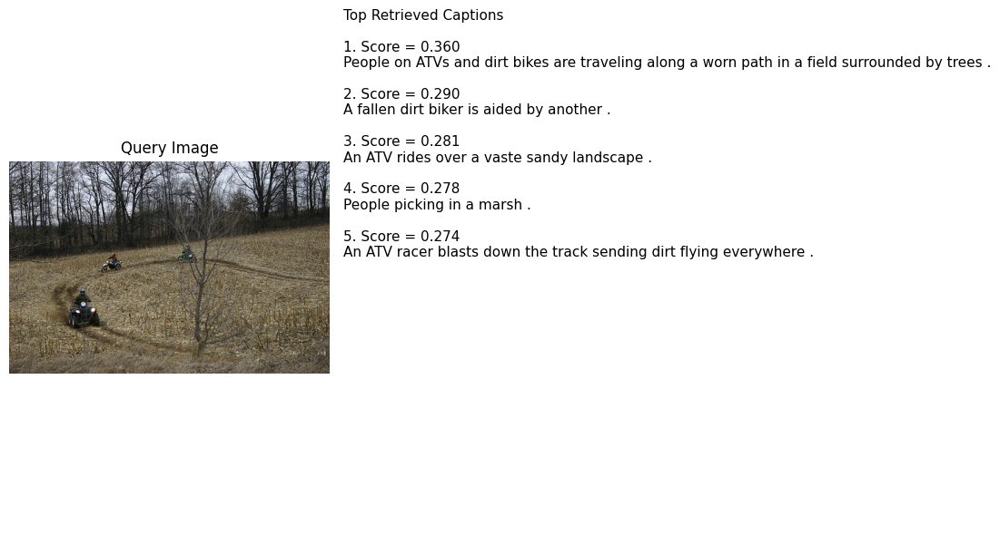

In [47]:
retrieve_captions(
    image_index=25,
    image_embeddings=valid_img_emb,
    text_embeddings=valid_txt_emb,
    captions=valid_caps_1,
    image_filenames=valid_img_files_ordered,
    image_root=CFG.image_path,
    k=5,
)

Veamos un ultimo ejemplo: clasificacion Zero-Shot 

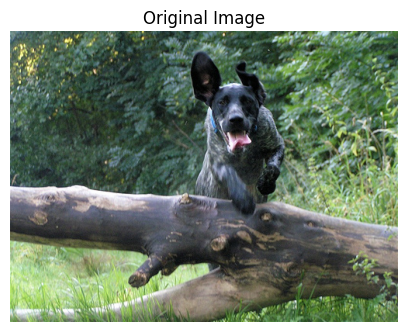

In [48]:
plt.figure(figsize=(5, 5))
plt.imshow(sample)
plt.title("Original Image")
plt.axis("off")
plt.show()

In [49]:
candidate_labels = ["a dog", "a cat", "a horse", "a person", "a bicycle"]

In [50]:
tokens = clip_tokenizer(candidate_labels).to(device)
image = preprocess(sample).unsqueeze(0).to(device)

In [51]:
with torch.inference_mode():
    text_features = clip_model.encode_text(tokens)
    text_features = F.normalize(text_features, dim=-1)

with torch.inference_mode():
    image_feature = clip_model.encode_image(image)
    image_feature = F.normalize(image_feature, dim=-1)

In [52]:
scores = image_feature @ text_features.T
prediction = candidate_labels[scores.argmax()]
print(prediction)

a dog


Veamos una visualizacion simple de los embeddings:

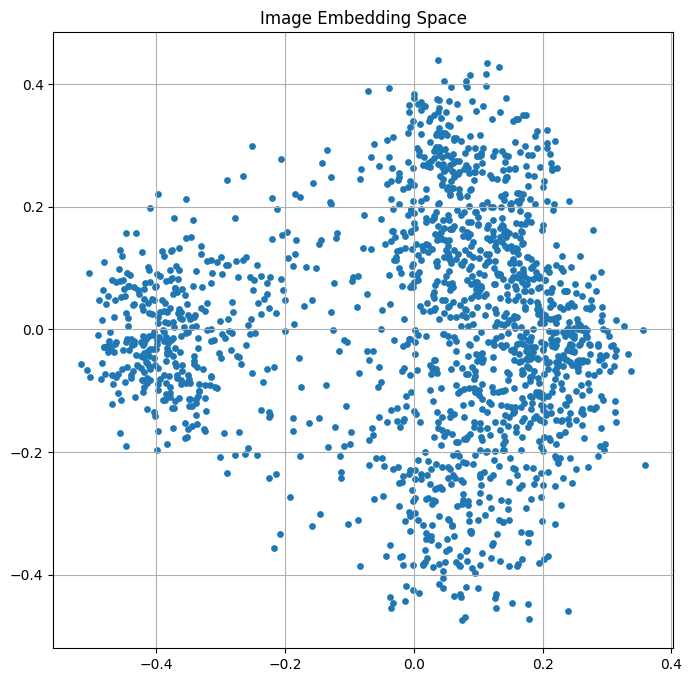

In [53]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X = pca.fit_transform(valid_img_emb.numpy())
plt.figure(figsize=(8, 8))
plt.scatter(X[:, 0], X[:, 1], s=15)
plt.grid(True)
plt.title("Image Embedding Space")
plt.show()

PCA no preserva todas las distancias; solo proyecta el espacio de alta dimensión a dos dimensiones para facilitar su visualización.

---

Hoy aprendimos:

✔ CLIP aprende un espacio compartido texto-imagen

✔ Las imágenes y los textos se representan mediante embeddings

✔ La similitud se calcula mediante cosine similarity

✔ Podemos hacer

Texto → Imagen

Imagen → Texto

Zero-Shot Classification

✔ Recall@K permite evaluar sistemas de recuperación.

Este pipeline es exactamente el que usarías para:
- Búsqueda de documentos por descripción (contrato, identificación, comprobante)
- Triaging de uploads (clasificar / detectar outliers)
- Indexación multimodal (vector DB) para backoffice

Claramente, en banca cambia el corpus: KYC, recibos, estados de cuenta, etc.

---

**Fundamentos de CLIP**

* ¿Qué es CLIP y para qué sirve?
* ¿Cómo se entrena CLIP y qué hace único a su enfoque de entrenamiento?
* Explica el concepto de "aprendizaje contrastivo" en el contexto de CLIP.
* ¿Cuáles son las principales diferencias entre CLIP y otros modelos de visión por computadora o procesamiento de lenguaje natural?

**Aspectos Técnicos**

* Describe cómo CLIP procesa las imágenes y los textos para realizar predicciones.
* ¿Cómo contribuye el entrenamiento con un conjunto de datos diverso al rendimiento de CLIP en diferentes tareas?
* Explica cómo CLIP logra ser eficaz en tareas de clasificación de imágenes sin necesidad de entrenamiento específico para esas tareas.

**Aplicaciones y Casos de Uso**

* Proporciona ejemplos de aplicaciones prácticas donde CLIP podría ser particularmente útil.
* ¿Cómo puede CLIP ser utilizado para mejorar los sistemas de búsqueda visual? Proporciona un ejemplo específico.
* ¿Cuáles son las implicaciones éticas y los desafíos potenciales al utilizar modelos como CLIP en aplicaciones del mundo real?

**Comparaciones y Contrastes**

* Compara CLIP con modelos tradicionales de visión por computadora en términos de flexibilidad y generalización.
* ¿En qué se diferencia CLIP de otros modelos de aprendizaje multimodal?

**Reflexión Crítica**

* ¿Cuáles son las limitaciones de CLIP y cómo podrían abordarse en futuras versiones o modelos similares?
* Discute el impacto potencial de la implementación de CLIP en la privacidad y la seguridad de la información.
* Reflexiona sobre cómo el desarrollo de tecnologías como CLIP podría influir en el futuro del procesamiento de lenguaje natural y la visión por computadora.

---

### Referencias:

* The Annotated ResNet-50: https://towardsdatascience.com/the-annotated-resnet-50-a6c536034758
* HuggingFace DistilBERT: https://www.scaler.com/topics/nlp/distilbert/
* CLIP' Paper: Learning Transferable Visual Models From Natural Language Supervision: https://arxiv.org/abs/2103.00020
* CLIP OPEN AI: https://openai.com/es-419/index/clip/
* https://towardsdatascience.com/clip-the-most-influential-ai-model-from-openai-and-how-to-use-it-f8ee408958b1/


Adaptado de:

* https://github.com/moein-shariatnia/OpenAI-CLIP/blob/master/OpenAI%20CLIP%20Simple%20Implementation.ipynb

![Lenguaje Matemático](./Images/Matematicas.png)

![Contacto](./Images/Contacto.png)